In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install tensorflow==2.6.0
!pip show tensorflow

     |████████████████████████████████| 458.3 MB 8.9 kB/s 
  Created wheel for clang: filename=clang-5.0-py3-none-any.whl size=30692 sha256=97a698bbca80da49e33882f62f6463197bfe216b169d2223da5dd926f9bf4ce6
  Stored in directory: /root/.cache/pip/wheels/98/91/04/971b4c587cf47ae952b108949b46926f426c02832d120a082a
  Created wheel for wrapt: filename=wrapt-1.12.1-cp37-cp37m-linux_x86_64.whl size=68723 sha256=5632eb8bf6cd96708629be70ca8ba8c7b4ade8e8f8dcf98408296ccae434239d
  Stored in directory: /root/.cache/pip/wheels/62/76/4c/aa25851149f3f6d9785f6c869387ad82b3fd37582fa8147ac6
Successfully built clang wrapt
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 3.10.0.2
    Uninstalling typing-extensions-3.10.0.2:
      Successfully uninstalled typing-extensions-3.10.0.2
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.13.3
    Uninstalling wrapt-1.13.3:
      Successfully uninstalled wrapt-1.13.3
  Attempting uninstall: flatbuffer

In [ ]:
%cd
%cd ../
%cd content/drive/MyDrive/capuchin_obj_detection

/root
/
/content/drive/MyDrive/capuchin_obj_detection


In [ ]:
!pwd

/content/drive/MyDrive/capuchin_obj_detection


In [ ]:
import os
os.listdir()

['pascal_voc_template.xml',
 'coco_labels.json',
 'coco_get_annotations_xml_format.py',
 'train_test_partition.py',
 'val.txt',
 'test.txt',
 'train.txt',
 'yolo_names.names',
 'labels.cache',
 '.DS_Store',
 'yolov5',
 'PrimNet',
 'labels',
 'datasets',
 'images',
 'train_test',
 '.ipynb_checkpoints',
 'models',
 'label_map.pbtxt',
 'saved']

In [ ]:
print(len(os.listdir("saved")))

6074


In [ ]:
##### DO THIS ON LOCAL MACHINE INSTEAD #####

#creating two dir for training and testing
# !rm -rf test_labels
# !rm -rf train_labels
# if len(os.listdir("saved")) < 2:
#   !ls test_labels/* | xargs -I{} mv {} saved/
#   !ls train_labels/* | xargs -I{} mv {} saved/

# Moves the rest of labels '1600' labels to the training dir: `train_labels`
if not os.path.exists("test_labels"):
  !mkdir test_labels train_labels

# lists the files inside 'annotations' in a random order (not really random, by their hash value instead)
# Moves the first 412/2000 labels (20% of the labels) to the testing dir: `test_labels`

!ls saved/* | sort -R | head -1214 | xargs -I{} mv {} test_labels/


# Moves the rest of labels '1600' labels to the training dir: `train_labels`
!ls saved/* | xargs -I{} mv {} train_labels/

In [ ]:
import os 

In [ ]:
len(os.listdir("train_labels/"))

4860

In [ ]:
!apt-get install -qq protobuf-compiler python-pil python-lxml python-tk
!pip install -qq Cython contextlib2 pillow lxml matplotlib pycocotools

Selecting previously unselected package python-bs4.
(Reading database ... 155222 files and directories currently installed.)
Preparing to unpack .../0-python-bs4_4.6.0-1_all.deb ...
Unpacking python-bs4 (4.6.0-1) ...
Selecting previously unselected package python-pkg-resources.
Preparing to unpack .../1-python-pkg-resources_39.0.1-2_all.deb ...
Unpacking python-pkg-resources (39.0.1-2) ...
Selecting previously unselected package python-chardet.
Preparing to unpack .../2-python-chardet_3.0.4-1_all.deb ...
Unpacking python-chardet (3.0.4-1) ...
Selecting previously unselected package python-six.
Preparing to unpack .../3-python-six_1.11.0-2_all.deb ...
Unpacking python-six (1.11.0-2) ...
Selecting previously unselected package python-webencodings.
Preparing to unpack .../4-python-webencodings_0.5-2_all.deb ...
Unpacking python-webencodings (0.5-2) ...
Selecting previously unselected package python-html5lib.
Preparing to unpack .../5-python-html5lib_0.999999999-1_all.deb ...
Unpacking pyt

In [ ]:
from __future__ import division, print_function, absolute_import

import pandas as pd
import numpy as np
import csv

import re
import os
import io
import glob
import shutil
import urllib.request
import tarfile
import xml.etree.ElementTree as ET

import tensorflow.compat.v1 as tf
import cv2 

from PIL import Image
from collections import namedtuple, OrderedDict

from google.colab import files

In [ ]:
print(tf.__version__)

2.6.0


In [ ]:
def xml_to_csv(path):
  classes_names = []
  xml_list = []

  for xml_file in glob.glob(path + '/*.xml'):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for member in root.findall('object'):
      classes_names.append(member[0].text)
      value = (root.find('filename').text + '.jpg',
               int(root.find('size')[0].text),
               int(root.find('size')[1].text),
               member[0].text,
               int(member[4][0].text),
               int(member[4][1].text),
               int(member[4][2].text),
               int(member[4][3].text))
      xml_list.append(value)
  column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
  xml_df = pd.DataFrame(xml_list, columns=column_name) 
  classes_names = list(set(classes_names))
  classes_names.sort()
  return xml_df, classes_names

for label_path in ['train_labels', 'test_labels']:
  image_path = os.path.join(os.getcwd(), label_path)
  xml_df, classes = xml_to_csv(label_path)
  xml_df.to_csv(f'{label_path}.csv', index=None)
  print(f'Successfully converted {label_path} xml to csv.')

label_map_path = os.path.join("label_map.pbtxt")
pbtxt_content = ""
for i, class_name in enumerate(classes):
    pbtxt_content = (
        pbtxt_content
        + "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)
    )
pbtxt_content = pbtxt_content.strip()
with open(label_map_path, "w") as f:
    f.write(pbtxt_content)

Successfully converted train_labels xml to csv.
Successfully converted test_labels xml to csv.


In [ ]:
%cd drive/My\ Drive

/content/drive/My Drive


In [ ]:
!git clone --q https://github.com/tensorflow/models.git

fatal: destination path 'models' already exists and is not an empty directory.


In [ ]:
# compils the proto buffers
%cd models/research
!protoc object_detection/protos/*.proto --python_out=.
# exports PYTHONPATH environment var with research and slim paths
os.environ['PYTHONPATH'] += ':./:./slim/'

/content/drive/My Drive/models/research


In [ ]:
!pip install tf_slim
!pip install tf-models-official==2.6.0

     |████████████████████████████████| 352 kB 5.1 MB/s 
     |████████████████████████████████| 1.8 MB 5.3 MB/s 
     |████████████████████████████████| 99 kB 9.3 MB/s 
     |████████████████████████████████| 47.6 MB 1.2 MB/s 
     |████████████████████████████████| 596 kB 69.2 MB/s 
     |████████████████████████████████| 213 kB 67.0 MB/s 
     |████████████████████████████████| 1.1 MB 70.4 MB/s 
     |████████████████████████████████| 1.2 MB 69.6 MB/s 
     |████████████████████████████████| 43 kB 1.8 MB/s 
     |████████████████████████████████| 4.9 MB 68.2 MB/s 
     |████████████████████████████████| 90 kB 9.2 MB/s 
     |████████████████████████████████| 489.6 MB 22 kB/s 
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22258 sha256=078ac76850dfb5fdbb6e6859c658d1df655d97d896ea4e93388634cf1c751934
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for seqeval: filename=seqeval-1

In [ ]:
# testing the model builder
!pip install keras==2.6.0
# !pip install tensorflow-io
# !python3 object_detection/builders/model_builder_tf2_test.py


     |████████████████████████████████| 1.3 MB 5.2 MB/s 
  Attempting uninstall: keras
    Found existing installation: keras 2.7.0
    Uninstalling keras-2.7.0:
      Successfully uninstalled keras-2.7.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.7.0 requires keras<2.8,>=2.7.0rc0, but you have keras 2.6.0 which is incompatible.


In [ ]:
print(tf.__version__)

2.6.0


In [ ]:
!pwd

/content/drive/My Drive/models/research


In [ ]:
#adjusted from: https://github.com/datitran/raccoon_dataset
from object_detection.utils import dataset_util


#change this to the base directory where your data/ is 
data_base_url = '/content/drive/My Drive/capuchin_obj_detection/'

#location of images
image_dir = data_base_url +'images/'

def class_text_to_int(row_label):
  if row_label == 'Papi':
    return 1
  if row_label == 'Pedro':
    return 2
  if row_label == 'Pele':
    return 3
  if row_label == 'Pery':
    return 4
  if row_label == 'Pesto':
    return 5
  if row_label == 'Piccolo':
    return 6
  if row_label == 'Pino':
    return 7
  if row_label == 'Pio':
    return 8   
  if row_label == 'Pirulo':
    return 9   
  if row_label == 'Pompeya':
    return 10
  if row_label == 'Popeye':
    return 11  
  if row_label == 'Punto':
    return 12
  else:
    None

def split(df, group):
  data = namedtuple('data', ['filename', 'object'])
  gb = df.groupby(group)
  return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]

def create_tf_example(group, path):
  print(group.filename)
  with tf.io.gfile.GFile(os.path.join(path, '{}'.format((group.filename)[0:-4])), 'rb') as fid:
    encoded_jpg = fid.read()
  encoded_jpg_io = io.BytesIO(encoded_jpg)
  image = Image.open(encoded_jpg_io)
  width, height = image.size
  filename = group.filename.encode('utf8')
  image_format = b'jpg'
  xmins = []
  xmaxs = []
  ymins = []
  ymaxs = []
  classes_text = []
  classes = []
  for index, row in group.object.iterrows():
    xmins.append(row['xmin'] / width)
    xmaxs.append(row['xmax'] / width)
    ymins.append(row['ymin'] / height)
    ymaxs.append(row['ymax'] / height)
    classes_text.append(row['class'].encode('utf8'))    
    classes.append(class_text_to_int(row['class']))
  tf_example = tf.train.Example(features=tf.train.Features(feature={
    'image/height': dataset_util.int64_feature(height),
    'image/width': dataset_util.int64_feature(width),
    'image/filename': dataset_util.bytes_feature(filename),
    'image/source_id': dataset_util.bytes_feature(filename),
    'image/encoded': dataset_util.bytes_feature(encoded_jpg),
    'image/format': dataset_util.bytes_feature(image_format),
    'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
    'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
    'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
    'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
    'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
    'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
  return tf_example
#creates tfrecord for both csv's
for csv in ['train_labels', 'test_labels']:
  writer = tf.io.TFRecordWriter(data_base_url + csv + '.record')
  path = os.path.join(image_dir)
  examples = pd.read_csv(data_base_url + csv + '.csv')
  grouped = split(examples, 'filename')
  for group in grouped:
    tf_example = create_tf_example(group, path)
    writer.write(tf_example.SerializeToString())
    
  writer.close()
  output_path = os.path.join(os.getcwd(), data_base_url + csv + '.record')
  print('Successfully created the TFRecords: {}'.format(data_base_url +csv + '.record'))

In [ ]:
# Some models to train on
MODELS_CONFIG = {
    'ssd_mobilenet_v2': {
        'model_name': 'ssd_mobilenet_v2_coco_2018_03_29',
    },
    'faster_rcnn_inception_v2': {
        'model_name': 'faster_rcnn_inception_v2_coco_2018_01_28',
    },
    'centernet_resnet101': {
        'model_name': 'centernet_resnet101_v1_fpn_512x512_coco17_tpu-8'
    },
    'ssd_resnet50_v1': {
        'model_name': 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8'
    }
}

# Select a model from `MODELS_CONFIG`.
# I chose ssd_mobilenet_v2 for this project, you could choose any
selected_model = 'centernet_resnet101'

In [ ]:
!pwd

/content/drive/My Drive/models/research


In [ ]:
#the distination folder where the model will be saved
DEST_DIR = '/content/drive/My Drive/models/research/pretrained_model'

# Name of the object detection model to use.
MODEL = MODELS_CONFIG[selected_model]['model_name']
# http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet101_v1_fpn_512x512_coco17_tpu-8.tar.gz
#selecting the model
MODEL_FILE = MODEL + '.tar.gz'

#checks if the model has already been downloaded, download it otherwise
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet101_v1_fpn_512x512_coco17_tpu-8.tar.gz -P /content/drive/My\ Drive/models/research/
!tar -xf centernet_resnet101_v1_fpn_512x512_coco17_tpu-8.tar.gz
!mv centernet_resnet101_v1_fpn_512x512_coco17_tpu-8 .


# #unzipping the model and extracting its content
# tar = tarfile.open(MODEL_FILE)
# tar.extractall()
# tar.close()

# # creating an output file to save the model while training
# os.remove(MODEL_FILE)
# if (os.path.exists(DEST_DIR)):
#     shutil.rmtree(DEST_DIR)
# os.rename(MODEL, DEST_DIR)

--2021-11-11 04:01:44--  http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet101_v1_fpn_512x512_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.214.128, 2607:f8b0:4001:c05::80
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.214.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 345992335 (330M) [application/x-tar]
Saving to: ‘/content/drive/My Drive/models/research/centernet_resnet101_v1_fpn_512x512_coco17_tpu-8.tar.gz’

centernet_resnet101 100%[===================>] 329.96M   104MB/s    in 3.2s    

2021-11-11 04:01:47 (102 MB/s) - ‘/content/drive/My Drive/models/research/centernet_resnet101_v1_fpn_512x512_coco17_tpu-8.tar.gz’ saved [345992335/345992335]

mv: 'centernet_resnet101_v1_fpn_512x512_coco17_tpu-8' and './centernet_resnet101_v1_fpn_512x512_coco17_tpu-8' are the same file


In [ ]:
# creating an output file to save the model while training
os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
    shutil.rmtree(DEST_DIR)
os.rename(MODEL, DEST_DIR)

In [ ]:
print(os.listdir())

['README.md', 'adversarial_text', 'attention_ocr', 'audioset', 'autoaugment', 'cognitive_planning', 'cvt_text', 'deep_speech', 'deeplab', 'delf', 'efficient-hrl', 'lfads', 'lstm_object_detection', 'marco', 'nst_blogpost', 'object_detection', 'pcl_rl', 'rebar', 'seq_flow_lite', 'slim', 'vid2depth', 'training', 'pretrained_model']


In [ ]:
print(os.path.exists(MODEL_FILE))


False


In [ ]:
!pwd

/content/drive/My Drive/models/research


In [ ]:
!mkdir training

mkdir: cannot create directory ‘training’: File exists


In [ ]:
!cat pretrained_model/pipeline.config

# CenterNet meta-architecture from the "Objects as Points" [1] paper
# with the ResNet-v2-101 backbone. The ResNet backbone has a few differences
# as compared to the one mentioned in the paper, hence the performance is
# slightly worse. This config is TPU comptatible.
# [1]: https://arxiv.org/abs/1904.07850

model {
  center_net {
    num_classes: 90
    feature_extractor {
      type: "resnet_v1_101_fpn"
    }
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 512
        max_dimension: 512
        pad_to_max_dimension: true
      }
    }
    object_detection_task {
      task_loss_weight: 1.0
      offset_loss_weight: 1.0
      scale_loss_weight: 0.1
      localization_loss {
        l1_localization_loss {
        }
      }
    }
    object_center_params {
      object_center_loss_weight: 1.0
      min_box_overlap_iou: 0.7
      max_box_predictions: 100
      classification_loss {
        penalty_reduced_logistic_focal_loss {
          alpha: 2.0
          

In [ ]:
%%writefile pretrained_model/pipeline.config
model {
  center_net {
    num_classes: 12
    feature_extractor {
      type: "resnet_v1_101_fpn"
    }
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 512
        max_dimension: 512
        pad_to_max_dimension: true
      }
    }
    object_detection_task {
      task_loss_weight: 1.0
      offset_loss_weight: 1.0
      scale_loss_weight: 0.1
      localization_loss {
        l1_localization_loss {
        }
      }
    }
    object_center_params {
      object_center_loss_weight: 1.0
      min_box_overlap_iou: 0.7
      max_box_predictions: 100
      classification_loss {
        penalty_reduced_logistic_focal_loss {
          alpha: 2.0
          beta: 4.0
        }
      }
    }
  }
}

train_config: {

  batch_size: 5
  num_steps: 250000

  data_augmentation_options {
    random_horizontal_flip {
    }
  }

  data_augmentation_options {
    random_crop_image {
      min_aspect_ratio: 0.5
      max_aspect_ratio: 1.7
      random_coef: 0.25
    }
  }


  data_augmentation_options {
    random_adjust_hue {
    }
  }

  data_augmentation_options {
    random_adjust_contrast {
    }
  }

  data_augmentation_options {
    random_adjust_saturation {
    }
  }

  data_augmentation_options {
    random_adjust_brightness {
    }
  }

  data_augmentation_options {
    random_absolute_pad_image {
       max_height_padding: 200
       max_width_padding: 200
       pad_color: [0, 0, 0]
    }
  }

  optimizer {
    adam_optimizer: {
      epsilon: 1e-7  # Match tf.keras.optimizers.Adam's default.
      learning_rate: {
        cosine_decay_learning_rate {
          learning_rate_base: 1e-3
          total_steps: 250000
          warmup_learning_rate: 2.5e-4
          warmup_steps: 5000
        }
      }
    }
    use_moving_average: false
  }
  max_number_of_boxes: 100
  unpad_groundtruth_tensors: false

  fine_tune_checkpoint_version: V2
  fine_tune_checkpoint: "/content/drive/MyDrive/models/research/pretrained_model/checkpoint/ckpt-0"
  fine_tune_checkpoint_type: "detection"
}

train_input_reader: {
  label_map_path: "/content/drive/MyDrive/capuchin_obj_detection/label_map.pbtxt"
  tf_record_input_reader {
    input_path: "/content/drive/My Drive/capuchin_obj_detection/train_labels.record"
  }
}

eval_config: {
  metrics_set: "pascal_voc_detection_metrics"
  use_moving_averages: false
  batch_size: 1;
}

eval_input_reader: {
  label_map_path: "/content/drive/MyDrive/capuchin_obj_detection/label_map.pbtxt"
  shuffle: false
  num_epochs: 1
  tf_record_input_reader {
    input_path: "/content/drive/My Drive/capuchin_obj_detection/test_labels.record"
  }
}


Overwriting pretrained_model/pipeline.config


In [ ]:
!pwd

/content/drive/My Drive/models/research


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=training/

<IPython.core.display.Javascript object>

In [ ]:
!nvidia-smi

Thu Nov 11 01:31:06 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# ####### UNCOMMENT BELOW ONCE IF YOU WANT TO RESUME TRAINING FROM LAST CHECKPOINT AND NOT START TRAINING FROM SCRATCH #######
# from __future__ import division, print_function, absolute_import

# import pandas as pd
# import numpy as np
# import csv

# import re
# import os
# import io
# import glob
# import shutil
# import urllib.request
# import tarfile
# import xml.etree.ElementTree as ET

# import tensorflow.compat.v1 as tf
# import cv2 

# from PIL import Image
# from collections import namedtuple, OrderedDict

# from google.colab import files
# # compils the proto buffers
# !protoc object_detection/protos/*.proto --python_out=.
# # exports PYTHONPATH environment var with research and slim paths
# os.environ['PYTHONPATH'] += ':./:./slim/'
# !pip install tf-slim 
!pip install lvis
!pip install tensorflow-io==0.21.0
# !pip install tf-models-official
# !pip install keras~=2.6.0
# os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'

# ####### UNCOMMENT ABOVE ONCE IF YOU WANT TO RESUME TRAINING FROM LAST CHECKPOINT AND NOT START TRAINING FROM SCRATCH #######
!pwd
!python3 object_detection/model_main_tf2.py \
    --pipeline_config_path=/content/drive/MyDrive/models/research/pretrained_model/pipeline.config \
    --model_dir=training/ 

     |████████████████████████████████| 22.7 MB 353 kB/s 
     |████████████████████████████████| 458.3 MB 4.9 kB/s 
     |████████████████████████████████| 2.1 MB 67.2 MB/s 
     |████████████████████████████████| 462 kB 70.1 MB/s 
     |████████████████████████████████| 5.6 MB 62.2 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.7.0
    Uninstalling tensorflow-estimator-2.7.0:
      Successfully uninstalled tensorflow-estimator-2.7.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.7.0
    Uninstalling tensorboard-2.7.0:
      Successfully uninstalled tensorboard-2.7.0
  Attempting uninstall: tensorflow-io-gcs-filesystem
    Found existing installation: tensorflow-io-gcs-filesystem 0.22.0
    Uninstalling tensorflow-io-gcs-filesystem-0.22.0:
      Successfully uninstalled tensorflow-io-gcs-filesystem-0.22.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.7.0
 

/content/drive/My Drive/models/research
2021-11-16 03:54:04.582263: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-11-16 03:54:04.582307: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (a45bd82b95c2): /proc/driver/nvidia/version does not exist
2021-11-16 03:54:04.582842: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
W1116 03:54:04.586977 139822423435136 cross_device_ops.py:1387] There are non-GPU devices in `tf.distribute.Strategy`, not using nccl allreduce.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
I1116 

In [ ]:
!mkdir exported_final_model_capuchin

In [ ]:
!pwd

/content


In [ ]:
# %cd models/research
# !pip install tf-slim
!pip install tensorflow-io==0.21.0
# !pip install tf-models-official
!python3 object_detection/exporter_main_v2.py \
  --input_type image_tensor \
  --pipeline_config_path /content/drive/MyDrive/models/research/pretrained_model/pipeline.config \
  --trained_checkpoint_dir training/ \
  --output_directory exported_final_model_capuchin/my_model

     |████████████████████████████████| 22.7 MB 4.1 MB/s 
     |████████████████████████████████| 2.1 MB 67.6 MB/s 
     |████████████████████████████████| 458.3 MB 10 kB/s 
     |████████████████████████████████| 5.6 MB 60.4 MB/s 
     |████████████████████████████████| 462 kB 69.5 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.7.0
    Uninstalling tensorflow-estimator-2.7.0:
      Successfully uninstalled tensorflow-estimator-2.7.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.7.0
    Uninstalling tensorboard-2.7.0:
      Successfully uninstalled tensorboard-2.7.0
  Attempting uninstall: tensorflow-io-gcs-filesystem
    Found existing installation: tensorflow-io-gcs-filesystem 0.22.0
    Uninstalling tensorflow-io-gcs-filesystem-0.22.0:
      Successfully uninstalled tensorflow-io-gcs-filesystem-0.22.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.7.0
  

2021-12-19 00:12:30.675610: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-12-19 00:12:30.675674: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (ff504d8c1cce): /proc/driver/nvidia/version does not exist
2021-12-19 00:12:30.861674: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W1219 00:12:45.985279 139904009004928 deprecation.py:616]

# Inference Results on Test Data



In [ ]:
import os
%cd drive/My\ Drive/models/research
# compils the proto buffers
!protoc object_detection/protos/*.proto --python_out=.
# exports PYTHONPATH environment var with research and slim paths
os.environ['PYTHONPATH'] += ':./:./slim/'

path2config ='exported_final_model_capuchin/my_model/pipeline.config'
path2model = 'exported_final_model_capuchin/my_model/checkpoint'

/content/drive/My Drive/models/research


In [ ]:
!pip install tensorflow==2.6.0
!pip install keras==2.6.0

from __future__ import division, print_function, absolute_import

import pandas as pd
import numpy as np
import csv

import re
import os
import io
import glob
import shutil
import urllib.request
import tarfile
import xml.etree.ElementTree as ET

import tensorflow.compat.v1 as tf
import cv2 

from PIL import Image
from collections import namedtuple, OrderedDict
!pip install tf-slim
!pip install tensorflow-io==0.21.0
!pip install tf-models-official==2.6.0
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
configs = config_util.get_configs_from_pipeline_file(path2config) # importing config
model_config = configs['model'] # recreating model config
detection_model = model_builder.build(model_config=model_config, is_training=False) # importing model

     |████████████████████████████████| 458.3 MB 10.0 kB/s 
  Created wheel for clang: filename=clang-5.0-py3-none-any.whl size=30692 sha256=28afd6f59d7c9a5f149deb567d70200cf10d39b4cb3d465c2049d00cad2634f3
  Stored in directory: /root/.cache/pip/wheels/98/91/04/971b4c587cf47ae952b108949b46926f426c02832d120a082a
  Created wheel for wrapt: filename=wrapt-1.12.1-cp37-cp37m-linux_x86_64.whl size=68712 sha256=63ae29007694b651b15a25bbdeae502ce3d158157e2173053e717f219fd1172e
  Stored in directory: /root/.cache/pip/wheels/62/76/4c/aa25851149f3f6d9785f6c869387ad82b3fd37582fa8147ac6
Successfully built clang wrapt
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 3.10.0.2
    Uninstalling typing-extensions-3.10.0.2:
      Successfully uninstalled typing-extensions-3.10.0.2
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.13.3
    Uninstalling wrapt-1.13.3:
      Successfully uninstalled wrapt-1.13.3
  Attempting uninstall: flatbuffe

     |████████████████████████████████| 1.3 MB 5.3 MB/s 
  Attempting uninstall: keras
    Found existing installation: keras 2.7.0
    Uninstalling keras-2.7.0:
      Successfully uninstalled keras-2.7.0
     |████████████████████████████████| 352 kB 5.4 MB/s 
     |████████████████████████████████| 22.7 MB 4.9 MB/s 
     |████████████████████████████████| 2.1 MB 66.7 MB/s 
  Attempting uninstall: tensorflow-io-gcs-filesystem
    Found existing installation: tensorflow-io-gcs-filesystem 0.22.0
    Uninstalling tensorflow-io-gcs-filesystem-0.22.0:
      Successfully uninstalled tensorflow-io-gcs-filesystem-0.22.0
     |████████████████████████████████| 1.8 MB 5.3 MB/s 
     |████████████████████████████████| 596 kB 61.9 MB/s 
     |████████████████████████████████| 90 kB 9.4 MB/s 
     |████████████████████████████████| 213 kB 68.8 MB/s 
     |████████████████████████████████| 1.2 MB 64.3 MB/s 
     |████████████████████████████████| 1.1 MB 62.1 MB/s 
     |████████████████████████████

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



     |████████████████████████████████| 489.6 MB 18 kB/s 
     |████████████████████████████████| 1.3 MB 59.2 MB/s 
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22258 sha256=823199183ed74fe46180fbad70726c69659c87f73c1b015fc4f20123d99a066c
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for seqeval: filename=seqeval-1.2.2-py3-none-any.whl size=16181 sha256=547eb7cccf549e39c249dac57b88c2ec9b48f1040b72d53439bb9c4a99b9ed28
  Stored in directory: /root/.cache/pip/wheels/05/96/ee/7cac4e74f3b19e3158dce26a20a1c86b3533c43ec72a549fd7
Successfully built py-cpuinfo seqeval
  Attempting uninstall: keras
    Found existing installation: keras 2.6.0
    Uninstalling keras-2.6.0:
      Successfully uninstalled keras-2.6.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.6.0
    Uninstalling tensorflow-2.6.0:
      Successfully uninstalled tensorflow-2.6.0
  Atte

In [ ]:
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(os.path.join(path2model, 'ckpt-0')).expect_partial()

In [ ]:
path2label_map = '/content/drive/MyDrive/capuchin_obj_detection/label_map.pbtxt' # TODO: provide a path to the label map file
category_index = label_map_util.create_category_index_from_labelmap(path2label_map,use_display_name=True)

In [ ]:
def detect_fn(image):
    """
    Detect objects in image.
    
    Args:
      image: (tf.tensor): 4D input image
      
    Returs:
      detections (dict): predictions that model made
    """

    image, shapes = detection_model.preprocess(image)
    prediction_dict = detection_model.predict(image, shapes)
    detections = detection_model.postprocess(prediction_dict, shapes)

    return detections

In [ ]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      numpy array with shape (img_height, img_width, 3)
    """
    
    return np.array(Image.open(path))

from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

def inference_with_plot(path2images, img_to_ground_truth_labels, box_th=0.25):
    """
    Function that performs inference and plots resulting b-boxes
    
    Args:
      path2images: an array with pathes to images
      box_th: (float) value that defines threshold for model prediction.
      
    Returns:
      None
    """
    for image_path in path2images:
      print('Running inference for {}... '.format(image_path), end='')
      image_np = load_image_into_numpy_array(os.path.join("/content/drive/MyDrive/capuchin_obj_detection/images", image_path))
      
      input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
      detections = detect_fn(input_tensor)

      # All outputs are batches tensors.
      # Convert to numpy arrays, and take index [0] to remove the batch dimension.
      # We're only interested in the first num_detections.
      num_detections = int(detections.pop('num_detections'))
      detections = {key: value[0, :num_detections].numpy()
                    for key, value in detections.items()}
      
      detections['num_detections'] = num_detections

      # detection_classes should be ints.
      detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

      label_id_offset = 1
      image_np_with_detections = image_np.copy()

      viz_utils.visualize_boxes_and_labels_on_image_array(
              image_np_with_detections,
              detections['detection_boxes'],
              detections['detection_classes']+label_id_offset,
              detections['detection_scores'],
              category_index,
              use_normalized_coordinates=True,
              max_boxes_to_draw=200,
              min_score_thresh=box_th,
              agnostic_mode=False,
              line_thickness=2)
      print("\n For " + image_path + " : ")
      # print("With ground truth labels : " + str(img_to_ground_truth_labels[image_path]))
      print("Inference :")
      cv2_imshow(image_np_with_detections)


In [ ]:
test_xml_paths = os.listdir("/content/drive/MyDrive/capuchin_obj_detection/test_labels/")
test_img_paths = []
dict_test_img_ground_truth_labels = {}
for path in test_xml_paths:
  img_file_path = path[:-3] + "jpg"
  test_img_paths.append(img_file_path)
  tree = ET.parse(os.path.join("/content/drive/MyDrive/capuchin_obj_detection/test_labels", path))
  root = tree.getroot()
  list_with_class_names = []
  for boxes in root.iter('object'):
      class_name = boxes.find("name").text
      list_with_class_names.append(class_name)
  dict_test_img_ground_truth_labels[img_file_path] = list_with_class_names
print(dict_test_img_ground_truth_labels)
print(test_img_paths)  

{'s4_3769.jpg': ['Pery'], 's16p1_3868.jpg': ['Pele'], 's9p3_3178.jpg': ['Papi'], 's9p3_2519.jpg': ['Pesto'], 's4_4109.jpg': ['Pery'], 's3_8034.jpg': ['Pery'], 's4_3406.jpg': ['Pery'], 's4_4795.jpg': ['Pery'], 's14p3_11288.jpg': ['Pery'], 's16p1_4496.jpg': ['Pedro'], 's14p3_10514.jpg': ['Pery'], 's4_973.jpg': ['Pino'], 's3_1516.jpg': ['Pele'], 's16p1_4059.jpg': ['Pele'], 's4_3301.jpg': ['Piccolo'], 's17p1_11747.jpg': ['Popeye'], 's3_10950.jpg': ['Punto'], 's4_7007.jpg': ['Pery'], 's4_5101.jpg': ['Pery'], 's16p2_2022.jpg': ['Pesto'], 's17p3_2731.jpg': ['Pirulo'], 's16p1_6498.jpg': ['Pery'], 's14p3_11528.jpg': ['Pery'], 's4_2594.jpg': ['Pele'], 's17p3_2557.jpg': ['Pesto', 'Pirulo'], 's16p2_6324.jpg': ['Pedro'], 's4_7146.jpg': ['Pery'], 's4_5040.jpg': ['Pery'], 's9p3_3363.jpg': ['Pirulo'], 's9p3_3637.jpg': ['Pirulo'], 's17p3_2142.jpg': ['Pirulo'], 's3_7431.jpg': ['Pery'], 's16p2_7136.jpg': ['Pery'], 's17p3_3211.jpg': ['Pirulo'], 's17p3_1826.jpg': ['Pirulo'], 's17p2_321.jpg': ['Popeye'], 's

In [ ]:
import random

Running inference for s4_7118.jpg... 
 For s4_7118.jpg : 
Inference :


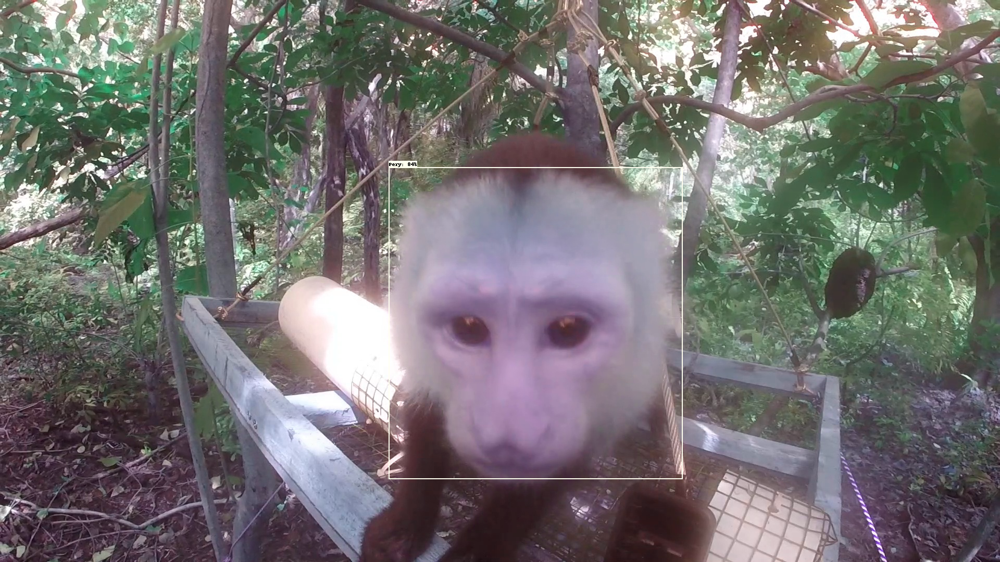

In [ ]:
inference_with_plot(["s4_6024.jpg"], dict_test_img_ground_truth_labels, box_th = 0.4)

In [ ]:
inference_with_plot(random.sample(test_img_paths, 10), dict_test_img_ground_truth_labels, box_th = 0.4)

In [ ]:
inference_with_plot(random.sample(test_img_paths, 10), dict_test_img_ground_truth_labels, box_th = 0.5)

In [ ]:
inference_with_plot(random.sample(test_img_paths, 10), dict_test_img_ground_truth_labels, box_th = 0.4)

In [ ]:
inference_with_plot(random.sample(test_img_paths, 10), dict_test_img_ground_truth_labels, box_th = 0.5)